# About

- In my [previous notebook](https://www.kaggle.com/hinepo/yolov8-finetuning-for-ppe-detection) I trained a Yolo v9 model to detect PPE (Personal Protective Equipment)
- And in this notebook I will use this model to detect and count how many people are inside a pre-determined Red Zone/Danger Zone
- Here I am combining two use cases: Red Zone counting + PPE detection
- This notebook and post-processing steps can also be used with results from a pretrained model with standard Yolo classes, or any other model that detects people. Just need to change the model's weights path
- [Ultralytics - docs](https://docs.ultralytics.com/)
- [Ultralytics - github](https://github.com/ultralytics/ultralytics)

Here you can see the workflow and steps I'm following, and its respective sections in this notebook.

![image.png](attachment:151b2b84-ea8b-4dca-aa4e-df82e8cd0b5a.png)

In [1]:
! nvidia-smi -L

/bin/bash: line 1: nvidia-smi: command not found


# Installs/Imports

In [2]:
%%time

! pip install ultralytics==8.1.29 -qq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.3/721.3 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 46.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 45.2 MB/s eta 0:00:00
CPU times: user 536 ms, sys: 136 ms, total:

In [3]:
import warnings
warnings.filterwarnings("ignore")

import os
import re
import glob
import yaml
import subprocess

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette('Set3')

import IPython.display as display
from IPython.display import Video

from PIL import Image
import cv2

import torch

from ultralytics import YOLO

In [4]:
import ultralytics
print(ultralytics.__version__)

8.1.29


# CFG

In [5]:
class CFG:
    ### inference: use any pretrained or custom model
    # WEIGHTS = 'yolov8x.pt' # yolov8n.pt, yolov8s.pt, yolov8m.pt, yolov8l.pt, yolov8x.pt
    WEIGHTS = '/content/best.pt'

    CONFIDENCE = 0.60
    CONFIDENCE_INT = int( round(CONFIDENCE * 100, 0) )

    CLASSES_TO_DETECT = [0, 2, 4, 5, 7] # Hardhat, NO-Hardhat, NO-Safety Vest, Person, Safety Vest

    VERTICES_POLYGON = np.array([[200,720], [0,700], [500,620], [990,690], [820,720]])

    EXP_NAME = 'ppe'

    ### just some video examples
    VID_001 = '/content/video-example-for-ppe-red-zone/IMG_4501.MOV'
    VID_002 = '/content/video-example-for-ppe-red-zone/example_video_2.mp4'

    ### choose filepath to make inference on (image or video)
    PATH_TO_INFER_ON = VID_001
    EXT = PATH_TO_INFER_ON.split('.')[-1] # get file extension
    FILENAME_TO_INFER_ON = PATH_TO_INFER_ON.split('/')[-1].split('.')[0] # get filename

    ### paths
    ROOT_DIR = '/content/video-example-for-ppe-red-zone/'
    OUTPUT_DIR = './'

In [6]:
glob.glob(CFG.ROOT_DIR + '*')

['/content/video-example-for-ppe-red-zone/IMG_4501.MOV']

## Image utils

In [7]:
def get_image_properties(image):
    if isinstance(image, str):
        # If image is a file path, read the image
        img = cv2.imread(image)
        if img is None:
            raise ValueError("Could not read image file")
    elif isinstance(image, np.ndarray):
        # If image is already a NumPy array, use it directly
        img = image
    else:
        raise ValueError("Input must be a file path or a NumPy array")

    # Get image properties
    properties = {
        "width": img.shape[1],
        "height": img.shape[0],
        "channels": img.shape[2] if len(img.shape) == 3 else 1,
        "dtype": img.dtype,
    }

    return properties

In [8]:
def display_image(image, print_info = True, hide_axis = False):
    if isinstance(image, str):  # Check if it's a file path
        img = Image.open(image)
        plt.imshow(img)
    elif isinstance(image, np.ndarray):  # Check if it's a NumPy array
        image = image[..., ::-1]  # BGR to RGB
        img = Image.fromarray(image)
        plt.imshow(img);
    else:
        raise ValueError("Unsupported image format")

    if print_info:
        print('Type: ', type(img), '\n')
        print('Shape: ', np.array(img).shape, '\n')

    if hide_axis:
        plt.axis('off')

    plt.show()

## Video utils

In [9]:
def get_video_properties(video_path):
    # Open the video file
    cap = cv2.VideoCapture(video_path)

    # Check if the video file is opened successfully
    if not cap.isOpened():
        raise ValueError("Could not open video file")

    # Get video properties
    properties = {
        "fps": int(cap.get(cv2.CAP_PROP_FPS)),
        "frame_count": int(cap.get(cv2.CAP_PROP_FRAME_COUNT)),
        "duration_seconds": int( cap.get(cv2.CAP_PROP_FRAME_COUNT) / cap.get(cv2.CAP_PROP_FPS) ),
        "width": int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),
        "height": int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)),
        "codec": int(cap.get(cv2.CAP_PROP_FOURCC)),
    }

    # Release the video capture object
    cap.release()

    return properties

In [10]:
### testing function
video_properties = get_video_properties(CFG.VID_001)
video_properties

{'fps': 30,
 'frame_count': 667,
 'duration_seconds': 22,
 'width': 464,
 'height': 848,
 'codec': 875967080}

# 👀📽️ Video to make inference on

In [11]:
OUT_VIDEO_NAME = './video_to_infer.mp4'

subprocess.run(
    [
        "ffmpeg",  "-i", CFG.PATH_TO_INFER_ON, "-crf",
        "18", "-preset", "veryfast", "-hide_banner", "-loglevel",
        "error", "-vcodec", "libx264", OUT_VIDEO_NAME
    ]
)

Video(data=OUT_VIDEO_NAME, embed=True, height=int(video_properties['height'] * 0.5), width=int(video_properties['width'] * 0.5))

# ⚡Adjust Red Zone

- Define ROI (Region of Interest, Red Zone, Danger Zone)
- Manually test and tune the Red Zone for your image or video
- After tuning polygon vertices, don't forget to update it in `CFG` section (VERTICES_POLYGON parameter)
- This will be used in `Annotate` section to post-process images and predictions, counting people in the Red Zone

In [12]:
print('File path to make inference on: ', CFG.PATH_TO_INFER_ON)
print('File name to make inference on: ', CFG.FILENAME_TO_INFER_ON)

File path to make inference on:  /content/video-example-for-ppe-red-zone/IMG_4501.MOV
File name to make inference on:  IMG_4501


In [13]:
cap = cv2.VideoCapture(CFG.PATH_TO_INFER_ON)

if not cap.isOpened():
    print("Error: Could not open video file.")
else:
    # Read the first frame
    ret, frame_test = cap.read()
    cap.release()

vertices_polygon = np.array([[200,720], [0,700], [500,620], [990,690], [820,720]]) # manually adjusted

cv2.polylines(frame_test, [vertices_polygon.reshape(-1, 1, 2)], True, (0, 0, 128), 4)

mod = frame_test.copy()
overlay = cv2.fillPoly(mod, pts = [vertices_polygon], color=(0, 0, 128))
background = frame_test.copy()

frame_test = cv2.addWeighted(
    src1 = background, # fisrt image
    alpha = 0.6, # first image weight
    src2 = overlay, # second image
    beta = 0.4, # second image weight
    gamma = 0.1, # scalar factor
    dst = overlay # output array shape
)

Type:  <class 'PIL.Image.Image'> 

Shape:  (848, 464, 3) 



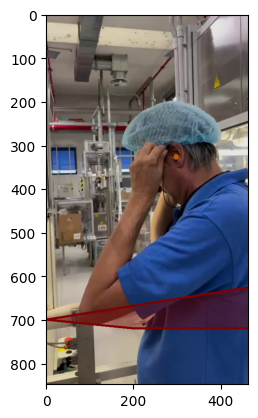

In [14]:
display_image(frame_test)

In [15]:
img_properties = get_image_properties(frame_test)
img_properties

{'width': 464, 'height': 848, 'channels': 3, 'dtype': dtype('uint8')}

After tuning the polygon vertces, just update them in CFG class.

# Model

With Ultralytics API you can easily run inference on any task:
  - Detection
  - Segmentation
  - Classification
  - Pose estimation

You can also make inference with any pre-trained Yolo model or any Custom model you've trained before.

For any of these changes, just change the model name when instantiating the YOLO object.

The post-processing section in this notebook is designed to clean and manipulate the outputs from the object detection task.

In [16]:
model = YOLO(CFG.WEIGHTS)

In [17]:
print('Device: ', model.device)

Device:  cpu


In [18]:
if torch.cuda.is_available():
    model.to('cuda:0')
else:
    print("CUDA device is not available. Running on CPU.")

CUDA device is not available. Running on CPU.


In [19]:
print('Device: ', model.device)
print('Weights: ', CFG.WEIGHTS)

Device:  cpu
Weights:  /content/best.pt


In [20]:
# model.model
model.names

{0: 'Helmet',
 1: 'Safety_goggles',
 2: 'Vest',
 3: 'Hairnet',
 4: 'Earplug',
 5: 'No Helmet',
 6: 'No safety_goggles',
 7: 'No vest',
 8: 'No hairnet',
 9: 'No\xa0earplug',
 10: 'Person'}

# ⚡Inference


In [21]:
%%time

results = model.predict(
    source = CFG.PATH_TO_INFER_ON,
    save = True,
    classes = CFG.CLASSES_TO_DETECT,
    conf = CFG.CONFIDENCE,
    save_txt = True,
    save_conf = True,
    show = True,
#     stream = True,
)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/667) /content/video-example-for-ppe-red-zone/IMG_4501.MOV: 640x352 1 Earplug, 1 No Helmet, 1 No vest, 362.7ms
video 1/1 (frame 2/667) /content/video-example-for-ppe-red-zone/IMG_4501.MOV: 640x352 2 Earplugs, 1 No Helmet, 1 No vest, 245.4ms
video 1/1 (frame 3/667) /content/video-example-for-ppe-red-zone/IMG_4501.MOV: 640x352 1 No Helmet, 1 No vest, 230.0ms
video

# 👀📽️ Raw inference video

In [22]:
RAW_INFERENCE_VIDEO = glob.glob('/content/runs/detect/predict/IMG_4501*')[0] # avi or mp4
OUT_VIDEO_NAME = './raw_inference_2.mp4'

subprocess.run(
    [
        "ffmpeg",  "-i", RAW_INFERENCE_VIDEO, "-crf",
        "18", "-preset", "veryfast", "-hide_banner", "-loglevel",
        "error", "-vcodec", "libx264", OUT_VIDEO_NAME
    ]
)

Video(data=OUT_VIDEO_NAME, embed=True, height=int(video_properties['height'] * 0.5), width=int(video_properties['width'] * 0.5))